In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as ss
from matplotlib.widgets import Slider
import pandas as pd
import glob
import dask.array as da
from scipy import ndimage

from scipy.io.wavfile import read
import sounddevice as sd
from mpl_toolkits import mplot3d

In [2]:
from glob import glob
import subprocess
from os.path import exists
import time as time_module
import plotly.express as px

In [3]:
import threading
import soundfile as sf

In [4]:
import pyrubberband
from librosa.beat import beat_track
from librosa import resample

## Convert mp3 to wav

In [5]:
songs = glob('songs/*.mp3')

In [6]:
ffmpeg_loc = glob('ffmpeg/*')[0]

In [8]:
#Converts mp3 to wav
for s in songs:
    if (~exists(s.split('.mp3')[0]+'.wav')):
        subprocess.call([ffmpeg_loc, '-i', s, s.split('.')[0] + '.wav'])

## Preprocessing

In [5]:
metadata = pd.read_csv('metadata.csv')

In [6]:
class Metronome:
    def __init__(self, fs):
        self.accent, fs_1 = sf.read('sounds/metronome_accent.wav', always_2d=True)
        self.metronome, fs_2 = sf.read('sounds/metronome.wav', always_2d=True)
        self.change_fs(fs_1, fs_2, fs)
        
    def change_fs(self, fs_1, fs_2, fs_new):
        self.accent = resample(self.accent.T, fs_1, fs_new, res_type='kaiser_fast').T
        self.metronome = resample(self.metronome.T, fs_2, fs_new, res_type='kaiser_fast').T

In [7]:
class track_info:
    def __init__(self, loc, bpm_guess, metadata):
        self.slots = 0
        if np.any(loc == metadata['loc'].values):
            idx = loc == metadata['loc'].values
            self.title = metadata['title'].values[idx][0]
            self.loc = metadata['loc'].values[idx][0]
            self.bpm = metadata['bpm'].values[idx][0]
            self.time_signature = metadata['time_signature'].values[idx][0]
            self.key = metadata['key'].values[idx][0]
            self.cue = metadata['cue'].values[idx][0]
            self.start_frame = metadata['start_frame'].values[idx][0]
            self.end_frame = metadata['end_frame'].values[idx][0]
            self.cue_frame = metadata['cue_frame'].values[idx][0]
            self.song, self.fs = sf.read(loc, always_2d=True)
            self.compute_vars()
        else:
            self.loc = loc
            self.title = loc.split('songs/')[1].split('.wav')[0]
            self.song, self.fs = sf.read(loc, always_2d=True)
            self.bpm, self.beats = beat_track(self.song[:,0], sr=self.fs, \
                                              start_bpm=bpm_guess, trim=True, units='samples')
            self.time_signature = 4
            self.start_frame = self.beats[0]
            self.cue_frame = self.start_frame
            self.end_frame = self.beats[-1]
            start_line = int(0-self.start_frame / (60 * (self.fs / self.bpm))) - 1
            end_line = int((len(self.song)-self.start_frame) / (60 * (self.fs / self.bpm))) + 1
            self.grid = self.start_frame + np.arange(start_line - start_line%self.time_signature, \
                                                     end_line, self.time_signature)*60*(self.fs / self.bpm)
            grid_diff = np.mean(np.diff(self.grid)) / 4
            self.beat_grid = np.hstack([[g, g+grid_diff, g+2*grid_diff, g+3*grid_diff] for g in self.grid])
            self.key = 'Unk'
        self.play_metronome = 0
        self.metronome = Metronome(self.fs)
        self._metronome_in_progress = 0
        self._metronome_sound = self.metronome.accent
        self.metronome_current_frame = 0
        self.metronome_volume = 1
        self.num_channels = 2
        
    def compute_vars(self):
        factor = (self.end_frame - self.start_frame) / (60 * self.fs * self.time_signature)
        self.bpm = int(np.round(self.bpm * factor)) / factor
        start_line = int(0-self.start_frame / (60 * (self.fs / self.bpm))) - 1
        end_line = int((len(self.song)-self.start_frame) / (60 * (self.fs / self.bpm))) + 1
        self.grid = self.start_frame + np.arange(start_line - start_line%self.time_signature, \
                                                 end_line, self.time_signature)*60*(self.fs / self.bpm)
        grid_diff = np.mean(np.diff(self.grid)) / 4
        self.beat_grid = np.hstack([[g, g+grid_diff, g+2*grid_diff, g+3*grid_diff] for g in self.grid])
        
    def play_track(self, start_frame=0):
        if self.slots == 1:
            self.current_frame = start_frame
        else:
            self.slots = 1
            self.current_frame = start_frame
            self.thread = threading.Thread(target=self._play_sound, args=())
            self.thread.start()
            
    def stop_track(self):
        self.slots = 0
        
    def nudge_track(self, num_beats):
        self.current_frame += int((num_beats / self.bpm) * 60 * self.fs)
    
    def _song_math(self, frames):
        self.playing = np.zeros((frames, self.num_channels))
        chunksize = min(len(self.song) - self.current_frame, frames)
        if self.current_frame >= 0: #Fixes issue where current frame is less than 0
            self.playing[:chunksize] += self.song[self.current_frame:self.current_frame + chunksize]
        if self.play_metronome:
            temp = np.zeros((chunksize, self.num_channels))
            next_grid = int(self.beat_grid[self.beat_grid - self.current_frame >= 0][0] - self.current_frame)
            next_grid_measure = int(self.grid[self.grid - self.current_frame >= 0][0] - self.current_frame)
            if self._metronome_in_progress:
                metronome_chunksize = min(len(self._metronome_sound) - self.metronome_current_frame, chunksize)
                if metronome_chunksize <= 0:
                    metronome_chunksize = 0
                    self.metronome_current_frame = 0
                    self._metronome_in_progress = 0
                else:
                    temp[:metronome_chunksize] = self._metronome_sound[self.metronome_current_frame:self.metronome_current_frame+metronome_chunksize]
                    self.metronome_current_frame += metronome_chunksize
            elif next_grid < chunksize:
                if next_grid==next_grid_measure:
                    self._metronome_sound = self.metronome.accent
                else:
                    self._metronome_sound = self.metronome.metronome
                temp[next_grid:] = self._metronome_sound[:chunksize-next_grid]
                self.metronome_current_frame = chunksize-next_grid
                self._metronome_in_progress = 1
            self.playing[:chunksize] += self.metronome_volume*temp
        self.playing[chunksize:] = 0
        self.current_frame += chunksize
        
    def _play_sound(self):
        
        def callback(outdata, frames, time_c, status):
            if status:
                print(status)
            self.time = time_c
            self._song_math(frames)
            self.next_frame = np.array([time_c.outputBufferDacTime - time_c.currentTime, time_module.time()])
            outdata[:] = self.playing

        stream = sd.OutputStream(
            samplerate=self.fs, channels=self.num_channels,
            callback=callback, finished_callback=self.stop_track, latency=0.2,
            blocksize=1024)
        with stream:
            while self.slots > 0:
                time_module.sleep(1)
                continue
    

In [8]:
songs = glob('songs/*.wav')
songs_processed = [s for s in songs if s in metadata['loc'].values]
songs_unprocessed = [s for s in songs if s not in metadata['loc'].values]

In [9]:
songs_processed

['songs/Noizu - Summer 91 (Looking Back) [Extended Mix].wav',
 "songs/Flux Pavilion - I Can't Stop.wav",
 'songs/By Your Side (Oliver Heldens Remix - Official Audio).wav',
 'songs/Hands That Feed.wav',
 'songs/The Hanging Tree.wav',
 'songs/Dezza & Dan Soleil - My Breath (Deeparture Remix).wav',
 "songs/Matt Lange - Rift (Alex O'Rion Remix).wav",
 "songs/Barry Can't Swim - Jazz Club After Hours.wav",
 'songs/Weiss - Feel My Needs (Purple Disco Machine Remix).wav',
 'songs/Farewell To The Moon (PROFF Remix).wav',
 'songs/John Summit - Deep End (Extended Mix).wav',
 'songs/gardenstate & Bien - The Best Part.wav',
 'songs/All I Need.wav',
 'songs/Virtual Self - Ghost Voices [Audio].wav',
 'songs/Bart B More - Never Let It Go.wav',
 'songs/Duck Sauce - Nonchalant (Audio).wav',
 "songs/Barry Can't Swim - Lone Raver.wav",
 'songs/Caravan Palace - Miracle (official audio).wav',
 'songs/Shingo Nakamura & Stendahl - Tribute, Chapter III [Monstercat Release].wav',
 'songs/Duke Dumont - Ocean Dri

In [10]:
song = track_info(songs_processed[5], 120, metadata)
print(song.title)
minute = str(int(len(song.song)/ song.fs / 60))
second = round((len(song.song) / song.fs / 60 % 1) * 60)
if second < 10:
    second = '0'+str(second)
else:
    second = str(second)
print(minute+':'+second)

Dezza & Dan Soleil - My Breath (Deeparture Remix)
4:13


In [21]:
song.play_track()

In [20]:
song.metronome_volume = 4
song.play_metronome = 1

In [22]:
song.stop_track()

In [403]:
# song.title = 'A-Trak - My Own Way (Extended Mix)'

In [41]:
%matplotlib notebook

In [42]:
import matplotlib.lines as mlines

class draggable_grid:
    def __init__(self, ax, X1, X2, X3, grid_lines, Yrange, color1, color2, color3):
        self.ax = ax
        self.c = ax.get_figure().canvas
        self.X1 = X1
        self.X2 = X2
        self.X3 = X3        
        self.grid_lines = grid_lines

        x1 = [X1, X1]
        x2 = [X2, X2]
        x3 = [X3, X3]
        y = [Yrange[0], Yrange[1]]
        self.line1 = mlines.Line2D(x1, y, picker=5, color=color1)
        self.line2 = mlines.Line2D(x2, y, picker=5, color=color2)
        self.line3 = mlines.Line2D(x3, y, picker=5, color=color3)
        self.ax.add_line(self.line1)
        self.ax.add_line(self.line2)
        self.ax.add_line(self.line3)
        self.c.draw_idle()
        self.sid = self.c.mpl_connect('pick_event', self.clickonline)

    def clickonline(self, event):
        if event.artist == self.line1:
            self.flag=1
            self.follower = self.c.mpl_connect("motion_notify_event", self.followmouse)
            self.releaser = self.c.mpl_connect("button_press_event", self.releaseonclick)
        elif event.artist == self.line2:
            self.flag=2
            self.follower = self.c.mpl_connect("motion_notify_event", self.followmouse)
            self.releaser = self.c.mpl_connect("button_press_event", self.releaseonclick)
        elif event.artist == self.line3:
            self.flag=3
            self.follower = self.c.mpl_connect("motion_notify_event", self.followmouse)
            self.releaser = self.c.mpl_connect("button_press_event", self.releaseonclick)

    def followmouse(self, event):
        if self.flag==1:
            self.line1.set_xdata([event.xdata, event.xdata])
        elif self.flag==2:
            self.line2.set_xdata([event.xdata, event.xdata])
        elif self.flag==3:
            self.line3.set_xdata([event.xdata, event.xdata])
        self.c.draw_idle()

    def releaseonclick(self, event):
        self.X1 = self.line1.get_xdata()[0]
        self.X2 = self.line2.get_xdata()[0]
        self.X3 = self.line3.get_xdata()[0]

        self.c.mpl_disconnect(self.releaser)
        self.c.mpl_disconnect(self.follower)

In [43]:
def plot_slider(x, y, start, end, cue, grid):
    """
    Don't forget to use the command "%matplotlib notebook" first!
    
    Parameters
    ----------
    sig : array to plot
    vlines : list of black, vertical lines to plot
    """
    fig, ax = plt.subplots()
    plt.subplots_adjust(bottom=0.25)

    minRange = 0
    maxRange = 3000000

    plt.yticks([], [])
    
    plt.plot(x, y)

    plt.axis([cue+minRange-100000, cue+maxRange-100000, 1.5*np.min(y),1.5*np.max(y)])

    axpos = plt.axes([0.22, 0.1, 0.6, 0.04])
    axwid = plt.axes([0.22, 0.05, 0.6, 0.04])

    xspos = Slider(axpos, 't', 0, x[-1] - 1000000, orientation='horizontal', valinit=cue+minRange-100000)
    xwidth = Slider(axwid, 'width', 10000,3000000, orientation='horizontal', valinit=maxRange)

    def update(val):
        xleft = xspos.val
        window_width = xwidth.val
        ax.axis([xleft,xleft + window_width,1.5*np.min(y),1.5*np.max(y)])
        fig.canvas.draw_idle()

    xspos.on_changed(update)
    xwidth.on_changed(update)
    
    grid_lines = []
    for g in grid:
        grid_lines.append(mlines.Line2D([g,g], [1.5*np.min(y),1.5*np.max(y)], picker=5, color='k'))
        ax.add_line(grid_lines[-1])
    
    LRlines = draggable_grid(ax, start, end, cue, grid_lines, [1.5*np.min(y),1.5*np.max(y)], 'green', 'red', 'blue')

    plt.show()
    return(xspos, xwidth, LRlines)

In [44]:
song.end_frame += 5000
song.compute_vars()
song.bpm

124.9392169905804

<IPython.core.display.Javascript object>


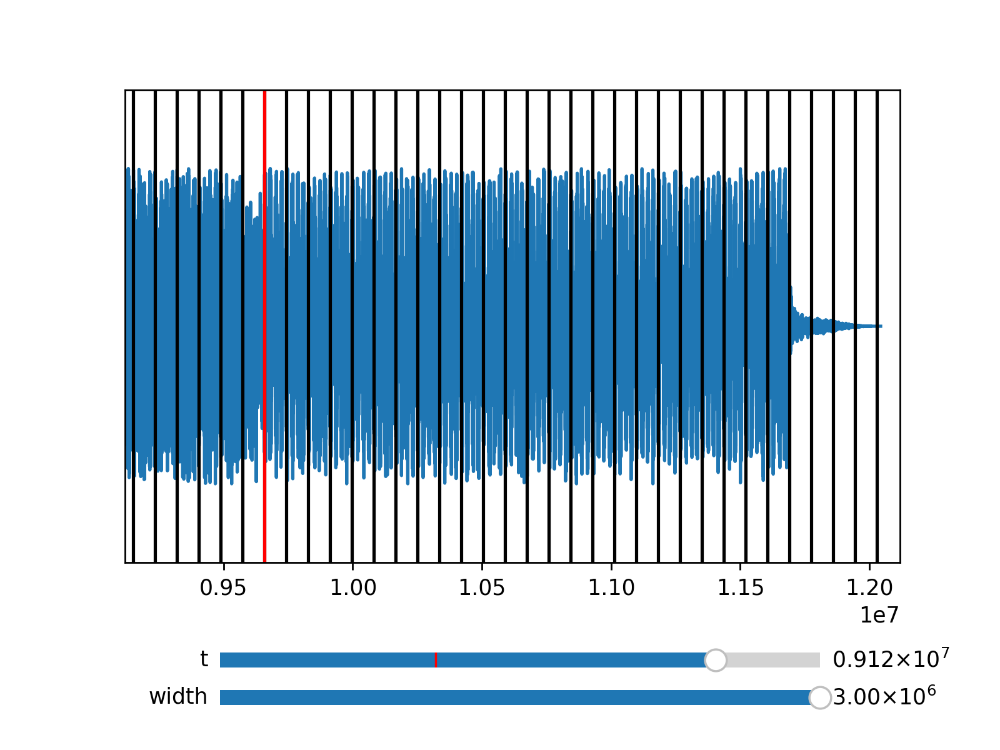

In [16]:
idx = np.arange(0,len(song.song),100)
_,_, LR_lines = plot_slider(idx, song.song[idx,0], song.start_frame, song.end_frame, song.cue_frame, song.grid)

In [15]:
song.start_frame = int(LR_lines.X1)
song.compute_vars()
song.end_frame = int(LR_lines.X2)
song.compute_vars()
song.cue_frame = int(LR_lines.X3)
song.cue_frame = int(song.grid[np.argmin(np.abs(song.grid - song.cue_frame))])
if(np.any(song.cue_frame - np.array([int(g) for g in song.grid]) == 0)):
    song.cue = 'Exact'
else:
    song.cue = 'Early'

In [564]:
song.bpm

121.99656413997599

In [566]:
# idx = 70
# print(str(idx) +'/'+ str(len(LR_lines.grid_lines)))
# song.play_track(int(LR_lines.grid_lines[idx].get_xdata()[0]))
song.play_track(int(LR_lines.X3))
# song.play_track(0)

In [568]:
song.stop_track()

In [559]:
song.nudge_track(-16)

In [560]:
song.cue_frame = int(song.grid[np.argmin(np.abs(song.grid - song.current_frame))])

In [567]:
song.key = 'Ebm'

In [17]:
idx = np.arange(0,len(song.song),100)
lines = song.grid[np.argwhere(song.start_frame == song.grid)[0,0]%4::4]
lines = lines[(lines>0) & (lines<len(song.song))]

fig = px.line(x = idx, y = song.song[idx,0], range_x=[0, len(song.song)])
fig.add_vline(song.start_frame, line_color='green', line_width=5)
fig.add_vline(song.end_frame, line_color='red', line_width=5)
fig.add_vline(song.cue_frame, line_color='blue', line_width=5)
for line in lines:
    fig.add_vline(line)
fig.update_layout(xaxis=dict(rangeslider=dict(visible=True),
                             type="linear"))
fig.show()

### Save Metadata

In [569]:
metadata_cur = pd.DataFrame()
metadata_cur['title'] = [song.title]
metadata_cur['bpm'] = [song.bpm]
metadata_cur['key'] = [song.key]
metadata_cur['time_signature'] = [song.time_signature]
metadata_cur['cue'] = [song.cue]
metadata_cur['loc'] = [song.loc]
metadata_cur['start_frame'] = [song.start_frame]
metadata_cur['end_frame'] = [song.end_frame]
metadata_cur['cue_frame'] = [song.cue_frame]

In [570]:
if np.any(metadata_cur['loc'].values[0] == metadata['loc'].values):
    idx = metadata_cur['loc'].values[0] == metadata['loc'].values
    metadata.loc[idx] = metadata_cur.values
else:
    metadata = metadata.append(metadata_cur, ignore_index=True)

In [571]:
metadata

,title,bpm,key,time_signature,cue,loc,start_frame,end_frame,cue_frame
0,Duck Sauce - Nonchalant,127.723473,Em,4,Early,songs/Duck Sauce - Nonchalant (Audio).wav,92432,7550419,81432
1,Virtual Self - Ghost Voices,119.992358,Cm,4,Exact,songs/Virtual Self - Ghost Voices [Audio].wav,803240,10946886,803240
2,Tinlicker & Dosem - Hypnotised,125.003044,Bbm,4,Exact,songs/Tinlicker & Dosem - Hypnotised.wav,2223273,18443038,2223273
3,Caravan Palace - Miracle,99.996142,Dm,4,Exact,songs/Caravan Palace - Miracle (official audio...,462254,8756974,462254
4,Enamour - Hands That Feed,123.994817,Ebm,4,Exact,songs/Hands That Feed.wav,1371640,9566047,1371640
5,Dezza & Dan Soleil - My Breath (Deeparture Remix),123.006357,Em,4,Exact,songs/Dezza & Dan Soleil - My Breath (Deepartu...,38409,8298665,2791827
6,Matt Lange - Rift (Alex O'Rion Remix),119.994098,Gbm,4,Exact,songs/Matt Lange - Rift (Alex O'Rion Remix).wav,99715,7012055,6244017
7,York - Farewell To The Moon (PROFF Remix),123.006089,Em,4,Exact,songs/Farewell To The Moon (PROFF Remix).wav,187487,7679799,187487
8,Gardenstate & Bien - The Best Part,122.986319,Gbm,4,Exact,songs/gardenstate & Bien - The Best Part.wav,705032,8278167,2081965
9,Barry Can't Swim - Lone Raver,130.284026,Cm,4,Exact,songs/Barry Can't Swim - Lone Raver.wav,1323345,10584465,1323345


In [572]:
metadata.to_csv('metadata.csv', index=False)

## DJ software

In [5]:
song_list = glob('songs/*.wav')
metadata = pd.read_csv('metadata.csv')

In [53]:
class global_commands:
    def __init__(self, bpm, fs=44100, num_channels=2):
        self.bpm = bpm
        self.bpm_new = self.bpm #bpm of next song
        self.fs = fs
        self.num_channels = num_channels
        self.crossfader = 0
        self.slots = np.zeros((4), dtype=int)
        self.vol = [0.8,0.8,0.8,0.8]
        self.master_vol = 0.8
        self.songs = [[],[],[],[]]
        self.current_frame = np.zeros((4), dtype=int)
        self.lpf = [20000,20000,20000,20000]
        self.hpf = [35,35,35,35]
        self._filter_edge_len = 100
        self.first = True
        
    def play_track(self, track_to_play, idx):
        self.songs[idx] = track_to_play.song.copy()
        self.current_frame[idx] = track_to_play.cue_frame
        
        if not self.first:
            cue_adjustment = track_to_play.cue_frame - track_to_play.grid
            cue_adjustment = cue_adjustment[cue_adjustment <= 0][0]
            next_measure = self.grid - self.grid_frame[1]
            if np.any(next_measure > 0):
                next_measure = next_measure[next_measure > 0][0]
            else:
                next_measure = 0
            self.current_frame[idx] = track_to_play.cue_frame - cue_adjustment - next_measure #Possible error here, may try and access negative numbers. Make sure this still works here                
            self.songs[idx][:track_to_play.cue_frame] = 0
            if idx==1 or idx==2:
                self.grid = track_to_play.grid
                self.grid_frame = np.array([idx, self.current_frame[idx]])
                
        self.slots[idx] = 1
        
        if self.first:
            self.thread = threading.Thread(target=self._play_sound, args=())
            self.thread.start()
            self.grid = track_to_play.grid
            self.grid_frame = np.array([idx, self.current_frame[idx]])
            self.first = False
        self.bpm = self.bpm_new
            
    def stop_track(self, idx):
        self.slots[idx] = 0
        self.songs[idx] = []
        self.current_frame[idx] = 0
        if idx==1:
            self.grid_frame = np.array([2, self.current_frame[2]])
        elif idx==2:
            self.grid_frame = np.array([1, self.current_frame[1]])
        
    def stop_all_tracks(self):
        for idx in range(len(self.slots)):
            self.stop_track(idx)
        self.first = True
            
    def nudge_track(self, idx, val):
        #val is in milliseconds
        self.current_frame[idx] += int((val/1000) * self.fs)
        
    def change_bpm(self, idx, bpm_new):
        self.songs[idx] = pyrubberband.time_stretch(self.songs[idx], self.fs, bpm_new / self.bpm)
        if idx==self.grid_frame[0]:
            self.grid = np.array([int(b) for b in self.grid * self.bpm / bpm_new])
            self.bpm_new = bpm_new
        self.current_frame[idx] = int(self.current_frame[idx] * self.bpm / bpm_new)
        self.grid_frame[1] = self.current_frame[self.grid_frame[0]]
        self.bpm = bpm_new
    
    
    def _song_math(self, frames):
        self.playing = np.zeros((frames, self.num_channels))
        for idx in np.argwhere(self.slots==1)[:,0]:
            chunksize = min(len(self.songs[idx]) - (self.current_frame[idx] + self._filter_edge_len), frames)
            #For changing bpm, but really doesn't work
#             if self.current_frame[idx] -512 >= 0:
#                 ratio = int(np.round(chunksize * self.bpm_new / self.bpm))
#                 y = self._linear_fader(self.crossfader, idx) * self.songs[idx][self.current_frame[idx]-512:self.current_frame[idx] + ratio + 512]
#                 y = pyrubberband.time_stretch(y, self.fs, ratio / chunksize)
#                 self.playing[:chunksize] += y[512:512+chunksize]
#                 self.current_frame[idx] += ratio
            if self.current_frame[idx] - self._filter_edge_len >=0:
                vol = self._linear_fader(self.crossfader, idx) * self.vol[idx] * self.master_vol
                if (vol > 1):
                    vol = 1
                elif (vol < 0):
                    vol = 0
                y = vol * self.songs[idx][self.current_frame[idx] - self._filter_edge_len:self.current_frame[idx] + chunksize + self._filter_edge_len]
                if(self.lpf[idx]<17000):
                    y_l = self._butter_filter(y, self.lpf[idx], 'low')
                else:
                    y_l = y
                if(self.hpf[idx]>=150):
                    y_h = self._butter_filter(y_l, self.hpf[idx], 'high')
                    self.playing[:chunksize] += y_h[self._filter_edge_len:-self._filter_edge_len]
                else:
                    self.playing[:chunksize] += y_l[self._filter_edge_len:-self._filter_edge_len]
            self.playing[chunksize:] = 0
            self.current_frame[idx] += chunksize
        self.grid_frame[1] = self.current_frame[self.grid_frame[0]]
        
    def _play_sound(self):
        
        def callback(outdata, frames, time_c, status):
            if status:
                print(status)
            self.time = time_c
            self._song_math(frames)
            self.next_frame = np.array([time_c.outputBufferDacTime - time_c.currentTime, time_module.time()])
            outdata[:] = self.playing

        stream = sd.OutputStream(
            samplerate=self.fs, channels=self.num_channels,
            callback=callback, finished_callback=self.stop_all_tracks, latency=0.3,
            blocksize=1024)
        with stream:
            while np.sum(self.slots) > 0:
                time_module.sleep(1)
                continue
    
    def _linear_fader(self, x, idx):
        if(idx>1):
            x = -x
        if x<=0:
            return(1)
        elif x>=1:
            return(0)
        else:
            return(1-x)
        
    def _butter_filter_ba(self, cutoff, btype, order=5):
        nyq = 0.5 * self.fs
        normal_cutoff = cutoff / nyq
        b, a = ss.butter(order, normal_cutoff, btype=btype, analog=False)
        return b, a
    
    def _butter_filter(self, data, cutoff, btype, order=5):
        b, a = self._butter_filter_ba(cutoff, btype, order=order)
        y = ss.filtfilt(b, a, data, axis=0)
        return y
    
    def _time_in_song(self, idx):
        minute1 = int(self.current_frame[idx] / self.fs / 60)
        second1 = int(round((self.current_frame[idx] / self.fs / 60 % 1) * 60))
        minute2 = int(len(self.songs[idx]) / self.fs / 60)
        second2 = int(round((len(self.songs[idx]) / self.fs / 60 % 1) * 60))
        if (second1 < 10):
            second1 = '0'+str(second1)
        else:
            second1 = str(second1)
        if (second2 < 10):
            second2 = '0'+str(second2)
        else:
            second2 = str(second2)
        return(str(minute1)+':'+second1+' / '+str(minute2)+':'+second2)

In [54]:
class track:
    def __init__(self, loc, control, metadata):
        #Preload Left
        
        if np.any(loc == metadata['loc'].values):
            idx = loc == metadata['loc'].values
            self.title = metadata['title'].values[idx][0]
            self.loc = metadata['loc'].values[idx][0]
            self.bpm = metadata['bpm'].values[idx][0]
            self.time_signature = metadata['time_signature'].values[idx][0]
            self.key = metadata['key'].values[idx][0]
            self.cue = metadata['cue'].values[idx][0]
            self.start_frame = metadata['start_frame'].values[idx][0]
            self.end_frame = metadata['end_frame'].values[idx][0]
            self.cue_frame = metadata['cue_frame'].values[idx][0]
            self.song, self.fs = sf.read(loc, always_2d=True)
            self.compute_grid()
        else:
            print('Song not preprocessed!! Ignoring track')
            return
        
#         self.volume = 1
        self.song, self.fs = sf.read(loc, always_2d=True)
        if self.fs != control.fs:
            self.change_fs(control.fs)
        self.change_bpm(control.bpm_new)
        
    def compute_grid(self):
        start_line = int(0-self.start_frame / (60 * (self.fs / self.bpm))) - 1
        end_line = int((len(self.song)-self.start_frame) / (60 * (self.fs / self.bpm))) + 1
        self.grid = self.start_frame + np.arange(start_line - start_line%self.time_signature, \
                                                 end_line, self.time_signature)*60*(self.fs / self.bpm)
        
    def change_fs(self, fs_new):
        self.song = resample(self.song.T, self.fs, fs_new, res_type='kaiser_fast').T
        self.start_frame = int(self.start_frame * fs_new / self.fs)
        self.end_frame = int(self.end_frame * fs_new / self.fs)
        self.cue_frame = int(self.cue_frame * fs_new / self.fs)
        self.fs = fs_new
        self.compute_grid()
    
    def change_bpm(self, bpm_new):
        self.song = pyrubberband.time_stretch(self.song, self.fs, bpm_new / self.bpm)
        self.grid = np.array([int(b) for b in self.grid * self.bpm / bpm_new])
        self.start_frame = int(self.start_frame * self.bpm / bpm_new)
        self.end_frame = int(self.end_frame * self.bpm / bpm_new)
        self.cue_frame = int(self.cue_frame * self.bpm / bpm_new)
        self.bpm = bpm_new
        
    def pitch_shift(self, n):
        self.song = pyrubberband.pyrb.pitch_shift(self.song, self.fs, n)
        
    def change_cue_frame(self, beat_change=0):
        if beat_change=='start':
            self.cue_frame = 0
        else:
            self.cue_frame = int(self.cue_frame + (beat_change / self.bpm) * 60 * self.fs)
            #Also issue with start frame before 0
#             if self.start_frame < 0:
#                 self.start_frame = self.beats[0]
        
    def _time_in_song(self):
        minute1 = int(self.cue_frame / self.fs / 60)
        second1 = int(round((self.cue_frame / self.fs / 60 % 1) * 60))
        minute2 = int(len(self.song) / self.fs / 60)
        second2 = int(round((len(self.song) / self.fs / 60 % 1) * 60))
        if (second1 < 10):
            second1 = '0'+str(second1)
        else:
            second1 = str(second1)
        if (second2 < 10):
            second2 = '0'+str(second2)
        else:
            second2 = str(second2)
        return(str(minute1)+':'+second1+' / '+str(minute2)+':'+second2)

In [27]:
#left plays on idx=1
#right plays on idx=2
#extra left plays on 0
#extra right plays on 3

In [55]:
control = global_commands(130)

In [56]:
metadata

,title,bpm,key,time_signature,cue,loc,start_frame,end_frame,cue_frame
0,Duck Sauce - Nonchalant,127.723473,Em,4,Early,songs/Duck Sauce - Nonchalant (Audio).wav,92432,7550419,81432
1,Virtual Self - Ghost Voices,119.992358,Cm,4,Exact,songs/Virtual Self - Ghost Voices [Audio].wav,803240,10946886,803240
2,Tinlicker & Dosem - Hypnotised,125.003044,Bbm,4,Exact,songs/Tinlicker & Dosem - Hypnotised.wav,2223273,18443038,2223273
3,Caravan Palace - Miracle,99.996142,Dm,4,Exact,songs/Caravan Palace - Miracle (official audio...,462254,8756974,462254
4,Enamour - Hands That Feed,123.994817,Ebm,4,Exact,songs/Hands That Feed.wav,1371640,9566047,1371640
5,Dezza & Dan Soleil - My Breath (Deeparture Remix),123.006357,Em,4,Exact,songs/Dezza & Dan Soleil - My Breath (Deepartu...,38409,8298665,2791827
6,Matt Lange - Rift (Alex O'Rion Remix),119.994098,Gbm,4,Exact,songs/Matt Lange - Rift (Alex O'Rion Remix).wav,99715,7012055,6244017
7,York - Farewell To The Moon (PROFF Remix),123.006089,Em,4,Exact,songs/Farewell To The Moon (PROFF Remix).wav,187487,7679799,187487
8,Gardenstate & Bien - The Best Part,122.986319,Gbm,4,Exact,songs/gardenstate & Bien - The Best Part.wav,705032,8278167,2081965
9,Barry Can't Swim - Lone Raver,130.284026,Cm,4,Exact,songs/Barry Can't Swim - Lone Raver.wav,1323345,10584465,1323345


In [57]:
control.bpm_new = 130

In [58]:
print('Currently Playing: ' + str(control.slots))
print('Volume: ' + str(control.vol))
print('Master Volume: ' + str(control.master_vol))
print('Low Pass: ' + str(control.lpf))
print('High Pass: ' + str(control.hpf))
print('CrossFade: ' + str(control.crossfader))
print('BPM: ' + str(control.bpm))
print('BPM of Next Song: ' + str(control.bpm_new))
print('')
if control.slots[1]:
    print('Left:  '+ control._time_in_song(1) + ' ' + left.title)
else:
    print('Left:  '+ left._time_in_song() + ' ' + left.title)
if control.slots[2]:
    print('Right: '+ control._time_in_song(2) + ' '+ right.title)
else:
    print('Right: '+ right._time_in_song() + ' '+ right.title)

Currently Playing: [0 0 0 0]
Volume: [0.8, 0.8, 0.8, 0.8]
Master Volume: 0.8
Low Pass: [20000, 20000, 20000, 20000]
High Pass: [35, 35, 35, 35]
CrossFade: 0
BPM: 130
BPM of Next Song: 130

Left:  0:48 / 3:03 Sagan - Feel Alive


NameError: name 'right' is not defined

In [11]:
left = track(metadata.loc[12]['loc'], control, metadata)

In [168]:
left.change_cue_frame(-32)

In [65]:
control.hpf[2] = 50
control.play_track(left, 1)

In [177]:
control.hpf[2] = 50

In [154]:
control.crossfader=0

In [66]:
control.stop_track(2)

In [29]:
right = track(metadata.loc[27]['loc'], control, metadata)

In [128]:
right.change_cue_frame(-32)

In [32]:
control.hpf[1] = 50
control.play_track(right, 2)

In [41]:
control.hpf[1] = 50

In [39]:
control.crossfader = 1

In [63]:
control.stop_track(1)

In [67]:
control.stop_all_tracks()

In [ ]:
#Try small chunks of bpm change where they play in different tracks and fade into each other

Steps left:\
General:
1. Map keyboard buttons 
2. Make a GUI
3. Make it a generic file that anyone can run
4. Map buttons to controller

Waveform Manipulation:
1. More specific effects (talk to Franz and do last) such as echos
2. Create limit of amplitude based on variance or something (to normalize data)

Song processing:
1. Make functions that can find keys

Other:
1. Make it possible to see waveform early and decide where to transition based on it (sliders?)
2. Create real time feedback of where we are in the song
3. Fix bug where I ignore anything when current frame is negative. Could ignore the beginning of song if the current frame is e.g. -1 (and skips first 1000 frames). Only fails if cue_frame is less than 1000
4. Make a post on my website showing how everything works (very late step)

Next Steps:
1. Make it so change bpm can always look at original waveform
2. Figure out how to change bpm mid song
3. Make a realtime ability to see track (try using threads that constantly update plotly plot)
4. Download one more song to check if 5 works
5. Add metronome to help with finding bpm quickly

Control Inputs (in a perfect world):

Sliders:\
4 volume (individual tracks)\
1 master volume\
1 cross fader\
3 master eq

Knobs:\
4 high pass\
4 low pass\
1 bpm control

Buttons:\
4 play/stop\
1 stop all\
4 loop last 4 bars\
4 loop last 8 bars\
4 Drum rolls\
4 Back spin

Control Inputs (narrowed down):


18 Analog Inputs:

Sliders:\
4 volume (individual tracks)\
1 cross fader\
3 master eq

Knobs:
2 high pass (left/right side)\
2 low pass (left/right)\
1 bpm\
4 programmable effects, e.g. reverb/delay thing (2 on each side)
1 global programmable effect

11 + N Digital Inputs

Buttons:\
4 play/stop\
1 stop all\
2 loop last 4 bars (left/right)\
2 loop last 8 bars (left/right)\
2 drum roll patterns (left/right)\
N programmable effects, e.g. backspin, or risers